<h1><center> Exploring Food Culture in the United States<center></h1>

# Introduction

Food is a huge part of our lives in America. There are websites, TV shows, challenges, careers, even outfits [(see Lady Gaga's meat dress)](https://mtv.mtvnimages.com/uri/mgid:file:http:shared:mtv.com/news/wp-content/uploads/2015/08/lady-gaga-meat-2-1440794946.jpg?quality=.8&height=1211.2&width=800)
that are centered around food as a culture. As lovers of food, our team has decided to look into data provided by Yelp and explore what could affect food preferences in different geographic location, which brings us to our main question:


<br></br>

<h4><center>🍔  Are there <b>any interesting patterns to identify in food preferences</b> in America?   🍟</center></h4>
<br><br>
There's actually a lot of speculation on this already, but not many findings published online. By the end of this exploration, we hope to demonstrate the power of data and how it can show both interesting and important information about the food culture in the United States. 

    


# Gathering Data


To understand the context of the situation, we researched articles(both academic and non academic) that looked into important factors of food choice, and then gathered data based on these claims. Even though they may not be 100% true, it gave us a good base for data analysis.

Several factors were heavily mentioned, such as:

    Economic
    Cultural
    Location
    Social
    Education

After spending a lot of time parsing through data, we decided to look at political and demographic data, which touches upon economic, cultural, and social factors, and separated the data by state. We also found that data is harder to come by than we thought, so we spent a lot of time looking for accurate and thourough data.

As always, lets start by importing the libraries we need


In [2]:
import json    
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go

import numpy as np
import tqdm 
from mpl_toolkits.axes_grid1 import make_axes_locatable

#And the tools from Sklearn to do our clustering
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.metrics import mean_squared_error

from scipy.sparse import csr_matrix

from datetime import datetime
from IPython import display
from IPython.display import YouTubeVideo

#Collaborative Filtering 
from fastai.collab import *


#To make things cleaner, lets also not display all the warnings
import warnings
warnings.filterwarnings('ignore')

## Yelp Data

Our main dataset is json files straight from Yelp which carries data from 2004 - 2018. The files are quite large, so to get them yourself, go to https://www.yelp.com/dataset/download and make an account. You will then see 2 download urls (review.json and business.json). Download both (we recommend using Chrome, as we ran into complications with Firefox). 

![download screen](assets/login.png)

Once the data is downloaded, we can now clean it up and turn it into a dataframe. 




Now lets look at the data. As you can business.json shows: 


| | **Business Data** | 
|----------|:-------------|
| business_id     | business key |
| name | name of business |
| address | address of business |
| city | city of business |
| state | state abbreviation |
| postal code | zipcode | 
| latitude | latitude of coordinates | 
| longitude | longitude of coordinates | 
| stars | amount of stars given based on ratings (out of 5) |
| review_count | how many reviews |
| is_open | is the business open | 
| attributes | things about parking type and takeout | 
| categories | type of food | 
| hours | when business is open |

In [3]:
# this function lets us get all the businesses
def load_businesses():
    businesses = []
    with open('business.json') as f:
        for line in tqdm.tqdm_notebook(f):
            businesses.append(json.loads(line))  
    return businesses
businesses = load_businesses()
testBusiness = businesses[1]
testBusiness


{'business_id': 'QXAEGFB4oINsVuTFxEYKFQ',
 'name': 'Emerald Chinese Restaurant',
 'address': '30 Eglinton Avenue W',
 'city': 'Mississauga',
 'state': 'ON',
 'postal_code': 'L5R 3E7',
 'latitude': 43.6054989743,
 'longitude': -79.652288909,
 'stars': 2.5,
 'review_count': 128,
 'is_open': 1,
 'attributes': {'RestaurantsReservations': 'True',
  'GoodForMeal': "{'dessert': False, 'latenight': False, 'lunch': True, 'dinner': True, 'brunch': False, 'breakfast': False}",
  'BusinessParking': "{'garage': False, 'street': False, 'validated': False, 'lot': True, 'valet': False}",
  'Caters': 'True',
  'NoiseLevel': "u'loud'",
  'RestaurantsTableService': 'True',
  'RestaurantsTakeOut': 'True',
  'RestaurantsPriceRange2': '2',
  'OutdoorSeating': 'False',
  'BikeParking': 'False',
  'Ambience': "{'romantic': False, 'intimate': False, 'classy': False, 'hipster': False, 'divey': False, 'touristy': False, 'trendy': False, 'upscale': False, 'casual': True}",
  'HasTV': 'False',
  'WiFi': "u'no'",
 

The review.json looks like this: 


| | **Review Data** | 
|----------|:-------------|
| review_id     | review key |
| user_id | who wrote the review |
| business_id | which business  |
| stars | rating given (out of 5) |
| date | date of review |
| text | actual review| 
| useful | votes given whether review is useful | 
| funny | votes given whether review is funny | 
| cool | votes given whether review is cool |

Now let's load the data. It is a huge dataset so just relax and get some coffee while you wait

In [4]:
#this function lets us get all the reviews
def load_reviews():
    reviews = []
    with open('review.json') as f:
        for line in tqdm.tqdm_notebook(f):
            reviews.append(json.loads(line))    
    return reviews
reviews = load_reviews() #global variable that holds all reviews
testReview = reviews[1] #lets see what a review looks like

testReview



{'review_id': 'GJXCdrto3ASJOqKeVWPi6Q',
 'user_id': 'yXQM5uF2jS6es16SJzNHfg',
 'business_id': 'NZnhc2sEQy3RmzKTZnqtwQ',
 'stars': 5.0,
 'useful': 0,
 'funny': 0,
 'cool': 0,
 'text': "I *adore* Travis at the Hard Rock's new Kelly Cardenas Salon!  I'm always a fan of a great blowout and no stranger to the chains that offer this service; however, Travis has taken the flawless blowout to a whole new level!  \n\nTravis's greets you with his perfectly green swoosh in his otherwise perfectly styled black hair and a Vegas-worthy rockstar outfit.  Next comes the most relaxing and incredible shampoo -- where you get a full head message that could cure even the very worst migraine in minutes --- and the scented shampoo room.  Travis has freakishly strong fingers (in a good way) and use the perfect amount of pressure.  That was superb!  Then starts the glorious blowout... where not one, not two, but THREE people were involved in doing the best round-brush action my hair has ever seen.  The team o

Now let's take this json and turn them into dataframes

### Review Data

In [5]:
#this function allows us to get all the ratings into a dataframe
def makeRatingsDF():

    review_id = []
    user_id = []
    business_id = []
    stars = []
    date = []

    for review in tqdm.tqdm_notebook(reviews):
        review_id.append(review['review_id'])
        user_id.append(review['user_id'])
        business_id.append(review['business_id'])
        stars.append(review['stars'])
        date.append(review['date'])

    ratingsDF = pd.DataFrame({'review_id': review_id,
                                 'user_id': user_id,
                                 'business_id': business_id,
                             'stars':stars,
                             'date':date})
    return ratingsDF
ratingsDF =  makeRatingsDF()
ratingsDF.head()

,review_id,user_id,business_id,stars,date
0,Q1sbwvVQXV2734tPgoKj4Q,hG7b0MtEbXx5QzbzE6C_VA,ujmEBvifdJM6h6RLv4wQIg,1.0,2013-05-07 04:34:36
1,GJXCdrto3ASJOqKeVWPi6Q,yXQM5uF2jS6es16SJzNHfg,NZnhc2sEQy3RmzKTZnqtwQ,5.0,2017-01-14 21:30:33
2,2TzJjDVDEuAW6MR5Vuc1ug,n6-Gk65cPZL6Uz8qRm3NYw,WTqjgwHlXbSFevF32_DJVw,5.0,2016-11-09 20:09:03
3,yi0R0Ugj_xUx_Nek0-_Qig,dacAIZ6fTM6mqwW5uxkskg,ikCg8xy5JIg_NGPx-MSIDA,5.0,2018-01-09 20:56:38
4,11a8sVPMUFtaC7_ABRkmtw,ssoyf2_x0EQMed6fgHeMyQ,b1b1eb3uo-w561D0ZfCEiQ,1.0,2018-01-30 23:07:38


### Business Data

In [6]:
# this function allows us to store the business json into a dataframe
def makeBusinessesDF():
    business_id = []
    business_name = []
    business_city = []
    business_state = []
    business_categories = []

    for business in tqdm.tqdm_notebook(businesses):
        business_id.append(business['business_id'])
        business_name.append(business['name'])
        business_city.append(business['city'])
        business_state.append(business['state'])    

        categories = None
        if business['categories'] != None:
            categories = ""
            for category in business['categories']:
                categories += category

        business_categories.append(categories)

    businessDFold = pd.DataFrame({'business_id': business_id,
                               'name': business_name,
                                 'city': business_city,
                                 'state': business_state, 
                              'categories': business_categories})
    return businessDFold
businessDF = makeBusinessesDF()
businessDF.head()

,business_id,name,city,state,categories
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,Phoenix,AZ,"Golf, Active Life"
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,Mississauga,ON,"Specialty Food, Restaurants, Dim Sum, Imported..."
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,Charlotte,NC,"Sushi Bars, Restaurants, Japanese"
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,Goodyear,AZ,"Insurance, Financial Services"
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,Charlotte,NC,"Plumbing, Shopping, Local Services, Home Servi..."


### City Data

Geographic location is quite important in terms of our data analysis, so we created a csv from the Yelp data to see cities and how they rate different categories of food. To save some space here, we will just load the csv and turn it into a dataframe as opposed to including it all here. The raw code for this, if your curious is in the Geographic Food Preference Analysis file in our repo. 

In [9]:
def cityRatings():
    ratings = pd.read_csv('cityYelp.csv', header=0)
    categories = list(ratings.columns)
    categories.remove('id')
    states = list(ratings['id'])
    data = {"city": [], "cat": [], "rating": []}
    for state in states:
        for cat in categories:
            rating =  ratings.loc[ratings["id"] == state, cat].iloc[0]
            if not np.isnan(rating):
                data["cat"].append(cat)
                data["city"].append(state)
                data["rating"].append( rating )
    new_ratings = pd.DataFrame(data)
    return new_ratings
city_ratings = cityRatings()
city_ratings

,city,cat,rating
0,"('Ahwatukee', 'AZ')",Sandwiches,3.920266
1,"('Ahwatukee', 'AZ')",Pizza,3.920266
2,"('Ahwatukee', 'AZ')",Fast Food,1.714286
3,"('Ahwatukee', 'AZ')",Breakfast & Brunch,4.216590
4,"('Ahwatukee', 'AZ')",Burgers,1.714286
...,...,...,...
4943,"('Youngtown', 'AZ')",Cafes,4.204082
4944,"('Youngtown', 'AZ')",Italian,4.076923
4945,"('Youngtown', 'AZ')",Diners,1.803922
4946,"('lyndhurst', 'OH')",Sandwiches,4.288462


Now we can see data from a specific city, for example: 

In [10]:
city_ratings.loc[city_ratings['city'] == "('Akron', 'OH')"]

,city,cat,rating
54,"('Akron', 'OH')",Sandwiches,3.983696
55,"('Akron', 'OH')",Pizza,3.492565
56,"('Akron', 'OH')",Chinese,3.411111
57,"('Akron', 'OH')",Steakhouses,3.641064
58,"('Akron', 'OH')",Mexican,3.774648
59,"('Akron', 'OH')",Fast Food,3.771875
60,"('Akron', 'OH')",Seafood,3.728556
61,"('Akron', 'OH')",Indian,3.706522
62,"('Akron', 'OH')",Gluten-Free,3.386503
63,"('Akron', 'OH')",Breakfast & Brunch,3.239829


# Data Cleaning
As in most times with data science, data does not come perfectly. There are intermediate steps in order to create awesome data visualizations and combine datasets. These were the steps we took to analyze the data by food category and city. 

The data contains places that are not in the US (for example, "XGL", which is greater London) so lets removes that data real quick.

In [11]:

filter1 = businessDF["state"].isin(["AK", "AL", "AR", "AZ", "CA", "CO", "CT", "DC",  
    "DE", "FL", "GA", "HI", "IA", "ID", "IL", "IN", "KS", "KY", "LA",  
    "MA", "MD", "ME", "MI", "MN", "MO", "MS", "MT", "NC", "ND", "NE",  
    "NH", "NJ", "NM", "NV", "NY", "OH", "OK", "OR", "PA", "RI", "SC",  
    "SD", "TN", "TX", "UT", "VA", "VT", "WA", "WI", "WV", "WY"]) 


In [12]:
businessDF = businessDF[filter1]

Now lets combine the ratings data and the business data to allow us to create some interesting visualizations that may provide some insight into our question

In [13]:
timeData = ratingsDF.join(businessDF.set_index('business_id'), on='business_id')
timeData = timeData.dropna()

In [14]:
timeData.head()

,review_id,user_id,business_id,stars,date,name,city,state,categories
0,Q1sbwvVQXV2734tPgoKj4Q,hG7b0MtEbXx5QzbzE6C_VA,ujmEBvifdJM6h6RLv4wQIg,1.0,2013-05-07 04:34:36,MountainView Hospital,Las Vegas,NV,"Fitness & Instruction, Doctors, Health & Medic..."
1,GJXCdrto3ASJOqKeVWPi6Q,yXQM5uF2jS6es16SJzNHfg,NZnhc2sEQy3RmzKTZnqtwQ,5.0,2017-01-14 21:30:33,Kelly Cardenas Salon - Hard Rock Hotel & Casino,Las Vegas,NV,"Beauty & Spas, Hair Stylists, Makeup Artists, ..."
2,2TzJjDVDEuAW6MR5Vuc1ug,n6-Gk65cPZL6Uz8qRm3NYw,WTqjgwHlXbSFevF32_DJVw,5.0,2016-11-09 20:09:03,J. Philipp Centers for Family and Cosmetic Den...,Chandler,AZ,"Health & Medical, Cosmetic Dentists, Orthodont..."
4,11a8sVPMUFtaC7_ABRkmtw,ssoyf2_x0EQMed6fgHeMyQ,b1b1eb3uo-w561D0ZfCEiQ,1.0,2018-01-30 23:07:38,White Teeth AZ,Scottsdale,AZ,"Teeth Whitening, Beauty & Spas"
5,fdiNeiN_hoCxCMy2wTRW9g,w31MKYsNFMrjhWxxAb5wIw,eU_713ec6fTGNO4BegRaww,4.0,2013-01-20 13:25:59,La Tavola Italiana,Pittsburgh,PA,"Restaurants, Italian, Pizza"


Now, let's try to organize this data by a food category. For example, lets see if we can get all the review data for a business where 'Chinese' was one of the categories. 

In [20]:
category = "Chinese"
catData = timeData[timeData["categories"].str.contains(category)]
catData

,review_id,user_id,business_id,stars,date,name,city,state,categories
17,6BnQwlxRn7ZuWdzninM9sQ,JSrP-dUmLlwZiI7Dp3PQ2A,cHdJXLlKNWixBXpDwEGb_A,3.0,2015-04-01 16:30:00,Chino Bandido,Phoenix,AZ,"Caribbean, Szechuan, Mexican, Restaurants, Chi..."
51,bvEdkl-weZGMLLRF9e0-ew,0nTJWagRU8_-KS1x7Zw5Yw,X5uxdU9GHoUAqo2wmbg3OQ,5.0,2015-11-06 00:02:50,Island Malaysian Cuisine,Las Vegas,NV,"Asian Fusion, Malaysian, Ethnic Food, Food, Sp..."
55,vAckaF8n0KKJeqHOnb1ayw,JjDR060LJQcNNVWKuU64fA,hcFSc0OHgZJybnjQBrL_8Q,4.0,2013-05-07 03:29:21,Everyday Noodles,Pittsburgh,PA,"Vegetarian, Noodles, Chinese, Restaurants"
117,ms7jlesqKq-1RE-yDaOxBw,fMQm1xCaEckajci8EHLgoQ,cPEo3-TmIqCwHLFGKZgwGg,5.0,2017-03-15 02:07:10,Chou's Kitchen,Chandler,AZ,"Chinese, Restaurants"
120,rHGTcKIfLTE9Y26aNJ__Yw,zN4M-hA86ps5I6BwXoqcqA,EdY6q0CO2mlATpoTFkvHAw,2.0,2017-02-19 08:49:25,Dim Sum Cafe,Las Vegas,NV,"Chinese, Dim Sum, Cafes, Restaurants"
...,...,...,...,...,...,...,...,...,...
6685677,TYLlgWyFUuYfKDblW0ltIA,omurcMm91c2y-c79OmSMiw,EHKzu5r2NEz5Zq2R84J4ow,4.0,2018-11-06 15:15:37,Taipei Tokyo,Monroeville,PA,"Japanese, Chinese, Restaurants"
6685681,nK2IBTpAR3tToyRY8ojxaA,1lok0wnwWYeSFMuh06PDcw,GhWMl0J2gOOH61BhBMTAAA,5.0,2016-05-08 03:38:38,Genghis Grill,Glendale,AZ,"Mongolian, Thai, American (Traditional), Asian..."
6685695,8s9UfRsLyzPOzszRomR1Kg,Qpnb76GbFxZVZmZCzmtUag,NXcV1HuXbfus0QNdI6UpOA,5.0,2018-11-11 00:43:46,Sweet & Spicy,Las Vegas,NV,"Asian Fusion, Chinese, Restaurants, Singaporean"
6685781,3eZ0cDt5YhyMMs11SMqMMA,PTAChUjs3Nf75zXgPBtDqg,6WRVv6S1IWR0nt4Lr2w7Og,5.0,2018-10-11 23:46:09,China A Gogo,Las Vegas,NV,"Restaurants, Chinese"


Now lets see how this data looks for every city. (We group by the city, state combination as there could potentially be two cities with the same name in different states.)

In [22]:
CatDataByCity = catData.groupby(['city', 'state']).agg('mean')
CatDataByCity['id'] = CatDataByCity.index
CatDataByCity

,,stars,id
city,state,,
Akron,OH,3.411111,"(Akron, OH)"
Allison Park,PA,2.800000,"(Allison Park, PA)"
Ambridge,PA,3.250000,"(Ambridge, PA)"
Amherst,OH,3.718182,"(Amherst, OH)"
Apache Junction,AZ,2.179487,"(Apache Junction, AZ)"
...,...,...,...
Willoughby,OH,3.313433,"(Willoughby, OH)"
Willoughby Hills,OH,3.600000,"(Willoughby Hills, OH)"
Willowick,OH,3.145161,"(Willowick, OH)"


Now, this is not interesting if we only do it for one category. Lets do it for 20 popular categories:

To do this we first create a dictionary where the key is the category and the value is the resulting dataframe of the average rating for each city for that category. 

In [23]:
categories = ["Sandwiches",
"Pizza",
"Chinese",
"Food Stands",
"Steakhouses",
"Mexican",
"Fast Food",
"Seafood",
"Indian",
"Gluten-Free",
"Breakfast & Brunch",
"Delis",
"Burgers",
"Salad",
"Vegan",
"Comfort Food",
"Mediterranean",
"Latin American",
"German",
"Cafes",
"Vegetarian",
"Italian",
"Middle Eastern",
"Diners",
"Hot Dogs",
"Caribbean",
"French",
"Buffets",
"Thai"]

datasets = dict()

for cat in categories:
    catData = timeData[timeData["categories"].str.contains(cat)]
    dat = catData.groupby(['city', 'state']).agg('mean')
    dat['id'] = dat.index
    datasets[cat] = dat

And now we just merge all the dataframes in the dictionary together

In [26]:
def mergeCategoryDf(info, info2):
    result = info.merge(info2, on='id', how='left')
    return result

vals = list(datasets.keys())

key = vals[0]
result = datasets[key]
result = result.rename(columns={'stars': key})

for key in vals[1:]:
    info = datasets[key]
    info = info.rename(columns={'stars': key})
    result = mergeCategoryDf(result, info)
    
result

,Sandwiches,id,Pizza,Chinese,Food Stands,Steakhouses,Mexican,Fast Food,Seafood,Indian,...,Cafes,Vegetarian,Italian,Middle Eastern,Diners,Hot Dogs,Caribbean,French,Buffets,Thai
0,3.920266,"(Ahwatukee, AZ)",3.920266,NaN,NaN,NaN,NaN,1.714286,NaN,NaN,...,NaN,NaN,3.920266,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3.983696,"(Akron, OH)",3.492565,3.411111,NaN,3.641064,3.774648,3.771875,3.728556,3.706522,...,4.107345,3.928105,3.742378,4.750000,3.000000,3.592593,3.833333,NaN,3.548628,3.879518
2,3.393258,"(Allison Park, PA)",3.467890,2.800000,NaN,NaN,NaN,3.272727,4.475410,NaN,...,4.512500,3.454545,3.735632,NaN,2.916667,NaN,NaN,NaN,NaN,4.554054
3,4.180328,"(Ambridge, PA)",4.471429,3.250000,NaN,NaN,3.666667,NaN,NaN,NaN,...,3.600000,NaN,4.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3.455285,"(Amherst, OH)",3.580247,3.718182,NaN,3.034483,3.247525,2.464286,3.347222,NaN,...,2.812500,NaN,3.697368,NaN,3.559140,4.019608,NaN,NaN,4.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
288,3.892857,"(Wilmerding, PA)",2.250000,NaN,NaN,NaN,NaN,NaN,3.647059,NaN,...,4.666667,NaN,3.346154,NaN,NaN,NaN,NaN,NaN,NaN,NaN
289,3.038462,"(Woodmere, OH)",3.097561,3.933333,NaN,3.898058,3.863366,2.290323,3.377049,NaN,...,NaN,3.966825,3.137255,4.076577,3.828571,NaN,NaN,NaN,NaN,NaN
290,3.668966,"(Woodmere Village, OH)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
291,2.428571,"(Youngtown, AZ)",NaN,NaN,NaN,NaN,NaN,2.043478,NaN,NaN,...,4.204082,NaN,4.076923,NaN,1.803922,NaN,NaN,NaN,NaN,NaN


# Data Exploration
Now that we gathered and cleaned our data, it's time for the fun, exploring the data! We will be utilizing several different libraries to aid us in learning more through the data. Let's see if we can get closer to answering our data science question.

![ChessUrl](https://media1.tenor.com/images/1d3f3feae507800574636111645f0319/tenor.gif?itemid=12683147 "chess")

## Data Span
To start, let's look at the span of our data. As we stated before, the dataset is not perfect, as it's missing states, but we can still see some cool things. For example:

In [15]:
def joinBandR():
    data = ratingsDF.join(businessDF.set_index('business_id'), on='business_id')
    rel = data[['state', 'stars']]
    rel = rel.groupby('state').agg(['count', 'mean'])
    rel['state'] = rel.index
    return rel

In [16]:
rel = joinBandR()
fig = go.Figure(data=go.Choropleth(
    locations=rel['state'], # Spatial coordinates
    z = rel[('stars', 'mean')].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Reds',
    colorbar_title = "Average Rating",
))

fig.update_layout(
    title_text = 'Average Yelp Rating by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

What we can see here is really interesting. It seems that Texas has a higher average rating than California and they both have higher ratings than New York. And whats even more interesting is that it is not the bustling states of California, Texas, or New York that have the highest average Yelp rating, but in fact states such as Tennesse and New Jersey. It is also good to note that Florida and Washington seem to have restaurants that got very poor ratings. But we should not just take this map at face value. Its important we make sure that the number of reviews from a state is enough to actually say something about the state

In [17]:
fig = go.Figure(data=go.Choropleth(
    locations=rel['state'], # Spatial coordinates
    z = rel[('stars', 'count')].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Blues',
    colorbar_title = "Number of Ratings",
))

fig.update_layout(
    title_text = 'Number of Yelp Ratings by State',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

Wow, it seems this dataset has millions of reviews from Nevada and Arizona of all places and only hundreds of reviews from all other states. This suggests that this dataset does not have a representative number of reviews from each state. Lets see what the breakdown of number of reviews looks like when we remove these huge outliers:

In [18]:
rel_no_outliers = rel[rel['state'] != "NV"]
rel_no_outliers = rel_no_outliers[rel_no_outliers['state'] != "AZ"]
rel_no_outliers

fig = go.Figure(data=go.Choropleth(
    locations=rel_no_outliers['state'], # Spatial coordinates
    z = rel_no_outliers[('stars', 'count')].astype(float), # Data to be color-coded
    locationmode = 'USA-states', # set of locations match entries in `locations`
    colorscale = 'Blues',
    colorbar_title = "Number of Ratings",
))

fig.update_layout(
    title_text = 'Number of Yelp Ratings by State (Without Outliers)',
    geo_scope='usa', # limite map scope to USA
)

fig.show()

These maps are also really interesting. They help show us there was barely any data about Tennesse and New Jersey and that is likely why they had an almost perfect average rating. Florida and Washington both had hundreds of reviews and so we can be a little more confident that the food in these states might actually not be that great. 

## Preference of Food Category
The United States has changed a lot since Yelp first started, and we can see something really interesting when we plot the rating of food categories over time. So let's actually write that out!

In [30]:
food_categories = ["Sandwiches","Pizza","Chinese","Food Stands","Steakhouses","Mexican","Fast Food",
                   "Seafood","Indian","Gluten-Free","Breakfast & Brunch","Delis","Burgers","Salad",
                   "Vegan","Comfort Food","Mediterranean","Latin American", "German","Cafes","Vegetarian",
                   "Italian","Middle Eastern","Diners","Hot Dogs","Caribbean","French","Buffets","Thai"]

def getCatData(category):
    catData = timeData[timeData["categories"].str.contains(category)]
    catData['year'] = pd.DatetimeIndex(catData['date']).year
    catDataTime = catData[['year', 'stars']]
    catData = catData.groupby('year').agg('mean')
    catData.reset_index(inplace=True)
    return catData

def plotCategories(categories):
    catData = []
    
    for cat in categories:
        catData.append(getCatData(cat))
    
    fig = go.Figure()

    for i in tqdm.tqdm_notebook(range(len(catData))):
        data = catData[i]
        cat_name = categories[i]
        
        fig.add_trace(go.Scatter(
                    x=data['year'],
                    y=data['stars'],
                    name=cat_name,
                    opacity=0.8))

    # Use date string to set xaxis range
    fig.update_layout(xaxis_range=['2006-01-01','2018-12-31'],
                      title_text="Yelp User Category Preferences Over Time")
    fig.show()

plotCategories(food_categories)

Use the legend to select/deselect which food categories you want to look at. If you play around with it you see things like how <b>Fast Food is the only category on a severe decline in ratings</b>. There has been a lot of backlash on Fast Food and their decease in quality of food so it's cool to see that reflected in the data. Also it looks like <b>Indian food and Mexican food are both quite close in slope and overall trends.</b> We could assume that could be because of similar flavor profiles of the type of food, but that brings up more data questions which can't be solved in the span of this project, but it definitely gives you something to think about.

In [34]:
catCorr = result.corr()
catCorr.style.apply(lambda x: ["background: red" if abs(v) > 0.3 else "" for v in x], axis = 1)

,Sandwiches,Pizza,Chinese,Food Stands,Steakhouses,Mexican,Fast Food,Seafood,Indian,Gluten-Free,Breakfast & Brunch,Delis,Burgers,Salad,Vegan,Comfort Food,Mediterranean,Latin American,German,Cafes,Vegetarian,Italian,Middle Eastern,Diners,Hot Dogs,Caribbean,French,Buffets,Thai
Sandwiches,1,0.339718,0.0567234,0.20185,0.223117,0.0298083,0.228915,0.0490562,-0.191687,0.155882,0.395305,0.238116,0.402016,0.30907,0.139168,0.30385,0.0135505,0.236596,-0.138203,0.207736,0.162573,0.15961,0.128501,0.374942,0.140174,0.0818038,0.303846,0.0493987,-0.0924595
Pizza,0.339718,1,0.09844,0.030762,0.164156,0.158184,0.0635555,0.0597751,0.236762,0.157482,0.0379537,0.119328,0.270848,0.179266,0.414304,0.169678,0.0829311,-0.107812,-0.178121,0.111486,0.172473,0.507937,0.0891824,0.282949,0.0333234,0.424997,-0.122778,0.232484,-0.000317136
Chinese,0.0567234,0.09844,1,0.487604,0.0504099,0.173764,-0.00541167,0.0895771,0.153009,0.18566,0.100777,0.117164,0.0343447,0.112794,-0.0175843,0.172089,0.116905,-0.0654038,0.125299,0.0244008,0.033639,0.0613826,0.0611165,0.108252,0.188372,0.237133,-0.1928,0.276798,0.120744
Food Stands,0.20185,0.030762,0.487604,1,0.0108733,-0.360977,-0.108431,-0.12647,0.306491,0.29969,0.559816,-0.550566,0.282561,0.178044,-0.224709,0.0596452,0.351019,-0.190328,-0.27214,0.421999,0.375223,-0.343808,0.136589,0.169043,0.192652,-0.131383,-0.110826,-0.0263106,0.394812
Steakhouses,0.223117,0.164156,0.0504099,0.0108733,1,0.314931,0.156276,0.334759,0.32702,0.214776,0.256648,-0.175759,0.245468,0.0364133,0.204058,0.214168,-0.0135231,0.0492375,-0.248261,0.190973,-0.11868,0.279595,-0.116806,0.419142,-0.0472265,0.0660029,-0.111725,0.241491,0.0160684
Mexican,0.0298083,0.158184,0.173764,-0.360977,0.314931,1,0.199063,0.221745,0.224854,-0.0233813,0.0303322,0.0975794,0.0717968,0.160203,-0.301117,0.115257,-0.0656171,0.117643,-0.129485,-0.00878127,-0.109363,0.0740327,-0.140473,0.066885,-0.101359,0.0677769,-0.330125,0.160631,0.232251
Fast Food,0.228915,0.0635555,-0.00541167,-0.108431,0.156276,0.199063,1,0.172561,-0.246874,-0.0521498,-0.0180049,0.0757667,0.449324,0.206518,0.0157265,0.101763,-0.225103,-0.0385853,-0.385997,-0.074406,0.05473,0.149221,0.0788236,0.103757,0.384009,-0.0255186,0.271899,0.0731915,0.0459103
Seafood,0.0490562,0.0597751,0.0895771,-0.12647,0.334759,0.221745,0.172561,1,0.169541,0.0480095,-0.0659445,0.105427,0.0183419,-0.0348225,-0.146998,0.244962,0.0131636,-0.0705096,-0.0809145,0.096887,-0.0837031,0.206318,0.110572,0.174571,0.060319,0.064158,-0.179528,0.213983,0.230328
Indian,-0.191687,0.236762,0.153009,0.306491,0.32702,0.224854,-0.246874,0.169541,1,0.0437643,0.193522,0.0342652,0.0731069,-0.0739926,0.215869,0.261206,-0.145233,0.211756,-0.0728496,0.367228,0.0779861,-0.0682934,0.227946,0.263356,0.0103141,-0.357468,0.181223,0.370804,-0.107381
Gluten-Free,0.155882,0.157482,0.18566,0.29969,0.214776,-0.0233813,-0.0521498,0.0480095,0.0437643,1,0.311173,0.0921251,0.0989502,0.0856844,0.130487,0.149186,0.0945397,0.231012,-0.0332065,-0.00688172,-0.101973,0.195583,0.106426,0.118147,0.0562391,0.337322,-0.0282529,0.0751041,0.39502


So, does this correlation matrix seem accurate. Well, some of the highest correlations are between Burgers and Fast Food, Vegan and Vegetarian, etc. and so forth. Thus, it does seems to capture relationships well to some degree. 

#### What can we see from this correlation matrix?
Take a look at French and Sandwiches, Gluten Free and Thai, and Indian and Steakhouses. These might be more interesting and unexpectedly correlated categories. This signficant correlation means that, across cities, these categories have similar average ratings.

Now look at Italian and Food Stands. We can see that they are negatively related - cities who like Italian Food typicaly don't like Food Stands.

In [45]:
bycity = result.transpose()
bycity.columns = bycity.iloc[2]
bycity = bycity.drop(['id', 'index'])
bycity = bycity.astype('float64')
cityCorr = bycity.corr()
cityCorr.style.apply(lambda x: ["background: red" if abs(v) > 0.8 else "" for v in x], axis = 1)

## Collaborative Filtering

Now, we are going to work on building a Collaborative filtering (CF) model for our cities and food categories. When you have a sparse matrix of ratings, a CF model is a good way of predicting unknown ratings. Effectively, we can recommend new food categories for cities to explore.

Made with help from https://towardsdatascience.com/collaborative-filtering-with-fastai-3dbdd4ef4f00

To begin, we load up data from a matrix of reviews. The column names have the different food categories, and the column "id" has all of the cities for which we have data.


In [35]:
ratings = pd.read_csv('cityYelp.csv', header=0)
print(ratings.columns)
print(ratings['id'])

Index(['id', 'Sandwiches', 'Pizza', 'Chinese', 'Food Stands', 'Steakhouses',
       'Mexican', 'Fast Food', 'Seafood', 'Indian', 'Gluten-Free',
       'Breakfast & Brunch', 'Delis', 'Burgers', 'Salad', 'Vegan',
       'Comfort Food', 'Mediterranean', 'Latin American', 'German', 'Cafes',
       'Vegetarian', 'Italian', 'Middle Eastern', 'Diners', 'Hot Dogs',
       'Caribbean', 'French', 'Buffets', 'Thai'],
      dtype='object')
0             ('Ahwatukee', 'AZ')
1               ('Airdrie', 'AB')
2                  ('Ajax', 'ON')
3                 ('Akron', 'OH')
4          ('Allison Park', 'PA')
                  ...            
380            ('Woodmere', 'OH')
381    ('Woodmere Village', 'OH')
382                ('York', 'ON')
383           ('Youngtown', 'AZ')
384           ('lyndhurst', 'OH')
Name: id, Length: 385, dtype: object


Now, we are going to convert our matrix into a 3-column matrix that gives us city-category-rating pairings. The collaborative filtering library requires the data to be in this format. The procedure here is pretty simple - we loop through every possible city, and category, then find the appropriate rating from the matrix. We put it all into a dictionary, which we then convert into a pd dataframe.

In [36]:
# ratings.columns
# new_ratings = pd.DataFrame
categories = list(ratings.columns)
categories.remove('id')
cities = list(ratings['id'])
# print(states)

data = {"city": [], "cat": [], "rating": []}


for city in cities:
    for cat in categories:
        rating =  ratings.loc[ratings["id"] == city, cat].iloc[0]
        # print(type(rating))
        if not np.isnan(rating):
            data["cat"].append(cat)
            data["city"].append(city) #removing whitespace and lowercasing
            # print(ratings.loc[ratings["state"] == state, cat])
            data["rating"].append( rating )

new_ratings = pd.DataFrame(data)
new_ratings.head

<bound method NDFrame.head of                      city                 cat    rating
0     ('Ahwatukee', 'AZ')          Sandwiches  3.920266
1     ('Ahwatukee', 'AZ')               Pizza  3.920266
2     ('Ahwatukee', 'AZ')           Fast Food  1.714286
3     ('Ahwatukee', 'AZ')  Breakfast & Brunch  4.216590
4     ('Ahwatukee', 'AZ')             Burgers  1.714286
...                   ...                 ...       ...
4943  ('Youngtown', 'AZ')               Cafes  4.204082
4944  ('Youngtown', 'AZ')             Italian  4.076923
4945  ('Youngtown', 'AZ')              Diners  1.803922
4946  ('lyndhurst', 'OH')          Sandwiches  4.288462
4947  ('lyndhurst', 'OH')             Burgers  4.288462

[4948 rows x 3 columns]>

Note that each of our cities, and categories adhere to a "first-letter capitalized" format, with a space in between the city and state. This will be important for if you try to find information in the dataframe, and for when we want to make predictions on certain cities in the prediction model below.

Let's take a look at some ratings for the city Avon, OH.

In [37]:
new_ratings.loc[new_ratings['city'] == "('Avon', 'OH')"]

,city,cat,rating
191,"('Avon', 'OH')",Sandwiches,3.521164
192,"('Avon', 'OH')",Pizza,4.053012
193,"('Avon', 'OH')",Chinese,2.703704
194,"('Avon', 'OH')",Steakhouses,3.957774
195,"('Avon', 'OH')",Mexican,2.890625
196,"('Avon', 'OH')",Fast Food,3.122727
197,"('Avon', 'OH')",Seafood,4.065574
198,"('Avon', 'OH')",Gluten-Free,4.166667
199,"('Avon', 'OH')",Breakfast & Brunch,3.056940
200,"('Avon', 'OH')",Delis,3.125000


Now to build the colab Filtering model. We will be using the fasai library to put this model together. We train the model by making a 'CollabLearner' object, which is a subclass of the Learner object from fastai. You can read more about these objects here:
https://docs.fast.ai/collab.html#Model-and-Learner

https://docs.fast.ai/basic_train.html#Learner

In [38]:
#Code from https://towardsdatascience.com/collaborative-filtering-with-fastai-3dbdd4ef4f00
data = CollabDataBunch.from_df(new_ratings, seed=42, valid_pct=0.1, user_name='city', item_name='cat', rating_name='rating')
data.show_batch()

city,cat,target
"('Verdun', 'QC')",Sandwiches,3.7911391
"('Carefree', 'AZ')",Salad,3.9824562
"('Outremont', 'QC')",Breakfast & Brunch,3.7142856
"('Sainte-Anne-De-Bellevue', 'QC')",Delis,1.6666666
"('Painesville', 'OH')",Steakhouses,3.4636872


In [39]:
#Code from https://towardsdatascience.com/collaborative-filtering-with-fastai-3dbdd4ef4f00
learn = collab_learner(data, n_factors=30, y_range=(1,5), wd=1e-1)
learn.fit_one_cycle(5, 5e-3)

epoch,train_loss,valid_loss,time
0,0.652918,0.565705,00:01
1,0.413963,0.341489,00:01
2,0.303899,0.331267,00:01
3,0.249522,0.326390,00:01
4,0.221699,0.324914,00:01


The fastai library allows us to see the loss that each level of our model is able to achieve. We can see that our model is able to bring validation loss down to about 32%, and is unable to improve it further (even though training loss, as expected, continues to drop). Fortunately, our validation loss does not spike back up dramatically, so we will use our 5-cycle trained model.

## Predicting with the model

Take a look at some predictions from our learned model on data that was in the original dataset. Below, we will make a function to get predictions for city-category pairings that weren't in the original dataset.

In [40]:
learn.show_results(rows=20)

city,cat,target,prediction
"('Aurora', 'OH')",Delis,3.5365853,3.3662922
"('Chagrin Falls', 'OH')",Vegetarian,4.117647,4.134492
"('Brossard', 'QC')",Thai,3.46,3.5040753
"('Scottsdale', 'AZ')",Salad,4.020856,3.700377
"('Seven Hills', 'OH')",Breakfast & Brunch,3.0,3.7352066
"('Greenfield Park', 'QC')",Steakhouses,2.5,2.82924
"('Broadview Heights', 'OH')",Comfort Food,2.3666666,3.199699
"('Vaughan', 'ON')",Delis,3.6976745,3.7956622
"('Fort Mill', 'SC')",Gluten-Free,3.5135136,3.816866
"('Stallings', 'NC')",Italian,3.893617,3.753958


Let's make a function that can predict how a city would rate a food category, even if we don't have that data explicitly in our training set. 

We use the predict method on the colab_learn object, given a city, state, and category. If the method is passed None for city/state or category, or if it's passed a value it doesn't recognize, it will give the prediction for just the given values. More on that below.

In [41]:
categories = list(ratings.columns)
categories.remove('id')
cities = list(ratings['id'])

def predict_rating(city, state, category, citystate = None, anticipated_rating = None):
    city = city
    state = state
    category = category

    if citystate == None:
        citystate = "('%s', '%s')"%(city, state)

    # Cases where we don't recognize / aren't given citystate / category
    # Letting the use know that the prediction won't be based on it
    if citystate not in cities and category in categories:
        print("City not recognized. Only predicting on category.")
    if category not in categories and citystate in cities:
        print("Category not recognized. Only predicting on city.")
    if category not in categories and citystate not in cities:
        print("Category and city not recognized. Predicting default average rating")

    tester_series = pd.Series([citystate, category], index=["city", "cat"])
    pred = learn.predict(tester_series)
    # print("Predicted rating:", (pred[0]))
    return float(pred[2])
    


Now for a prediction. For Avon, OH, there is no rating for Indian food. Let's take a look at what our model predicts would be the predicted rating for an Indian restaurant starting in Avon.

In [42]:
predict_rating("Avon", "OH", "Indian")

3.7472541332244873

Given how colaborative filtering works, we can also make a prediction on just a category. This gives an estimate of how an arbitrary city for which we have no data would rate the given category. Similarly, we can use our model to predict on just the city, which gives us how highly a city would probably rank any given food category that might set up shop in the city.

Also, just for completeness, if you pass in None for every field, the model yields the predicted rating of any arbitrary restaurant, in any arbitrary city.

In [43]:
print(predict_rating(None, None, "Sandwiches"))
print(predict_rating("Avon", "OH", None))
print(predict_rating(None,None,None))

City not recognized. Only predicting on category.
3.1544153690338135
Category not recognized. Only predicting on city.
3.0470564365386963
Category and city not recognized. Predicting default average rating
3.009425401687622


## Building a framework to answer questions
Now, imagine you are a new restaurant looking to set up shop. You know your categories, but want to know what the best area is to establish. Alternatively, what if you know where you want to build a restaurant, but don't know what the best type of food to sell will be. 

We will make two functions, one for each case, that will give you an ordered list of top choices to ensure the success of your restaurant. For the one where you already know your categories, there is the option to limit it to a certain state.

We also create a display function, in which we display the top suggestions, their predicted rank, and whether such a city-category pairing exists in the given data.

We also create a small helper function test_exists to tell us whether a given pairing already exists in the training data.

Finally, we tie it all together with the "find" function that will perform the appropriate actions depending on the given data.

In [44]:
categories = list(ratings.columns)
categories.remove('id')
cities = list(ratings['id'])


def display_ratings(rating_list):
    # rating_list: [(name, rating, exists), ...]
    # Displays a pretty table of this info
    df = pd.DataFrame(rating_list, columns = ["Suggestion", "Predicted rating", "Established?"])
    display(df)

def test_exists(city, state, category, citystate = None):

    if citystate == None:
        citystate = "('%s', '%s')"%(city, state)

    rating = new_ratings.loc[new_ratings["city"] == citystate][new_ratings["cat"] == category]
    # print(rating["rating"])
    # print(type(rating))
    if not rating.empty:
        return True
    return False

def find_best_categories(city, state, num_display = 5):
    cat_ratings = [] #[(category, rating, exists), ...]
    for cat in categories:
        if city == None:
            for citystate in cities:
                if f", '{state}')" in citystate:
                    exists = "Exists" if test_exists(citystate, state, cat) else "Not yet"
                    cat_ratings.append(((cat, citystate), predict_rating(None, state, cat, citystate = citystate) , exists))
        else:
            exists = "Exists" if test_exists(city, state, cat) else "Not yet"
            cat_ratings.append((cat, predict_rating(city, state, cat) , exists))
    cat_ratings.sort(key=lambda x: x[1], reverse = True)
    display_ratings(cat_ratings[:num_display])
    # return cat_ratings

def find_best_cities(category, state = None, num_display = 5):
    city_ratings = [] #[(category, rating, exists), ...]
    for city in cities:

        # Filter to ensure that we stay within the given state
        if state == None or (state != None and f", '{state}')" in city):

            # We will call predict_rating a bit differently
            # Our 'city' string is actually a string of city and state, so we trigger different behavior
            exists = "Yes" if test_exists(None, None, category, city) else "Not yet"
            city_ratings.append((city, predict_rating(None, None, category, citystate = city) , exists))

    city_ratings.sort(key=lambda x: (x[1]), reverse = True)
    display_ratings(city_ratings[:num_display])
    # return city_ratings

def find(city = None, state = None, category = None):
    if city and state and category:
        print("Predicted rating:", predict_rating(city, state, category))

    if (city and state and not category) or (state and not city and not category):
        find_best_categories(city, state)
    
    if (category and not city and not state):
        find_best_cities(category)

    if (category and state and not city):
        find_best_cities(category, state = state)


# test_exists("Avon", "OH", "Bread")

## Use cases - answering the big questions

Let's test it out! Say we want to open a vegan restaurant. Where do we want to set up shop?

We will run through the following test cases:


1.   I want to open a Vegan restaurant. Where should I open?
2.   I want to open a Vegan restaurant only in Pennsylvania. Where should I open?
3.   I want to open a restaurant in Springdale, PA. What type of food should I serve?
4.   I want to open a restaurant in Pennsylvania, but I don't care where. What food should I serve, and in what city should I open my restaurant?





In [ ]:
print("Case 1: Where should I open up my Vegan restaurant?")
find(category = "Vegan")

print("\n\nCase 2: Where should I open up my Burger shop in Pennsylvania?")
find(category = "Burgers", state = "PA")

print("\n\nCase 3: What kind of food should I serve if I open a restaurant in Newbury OH?")
find(city = "Newbury", state = "OH")

# This last one is going to take a bit longer than the others to run
print("\n\nCase 4: I want to open a restaurant somewhere in Ohio. What city should I go to and what kind of food should I serve?")
find(state = "OH")

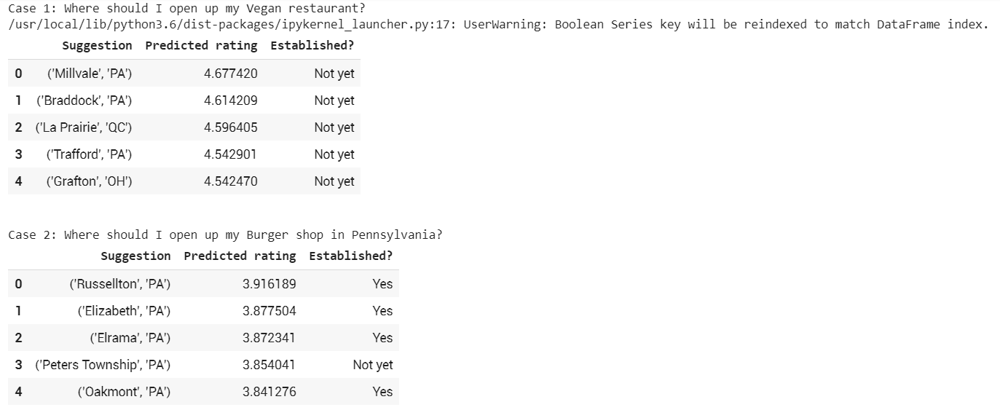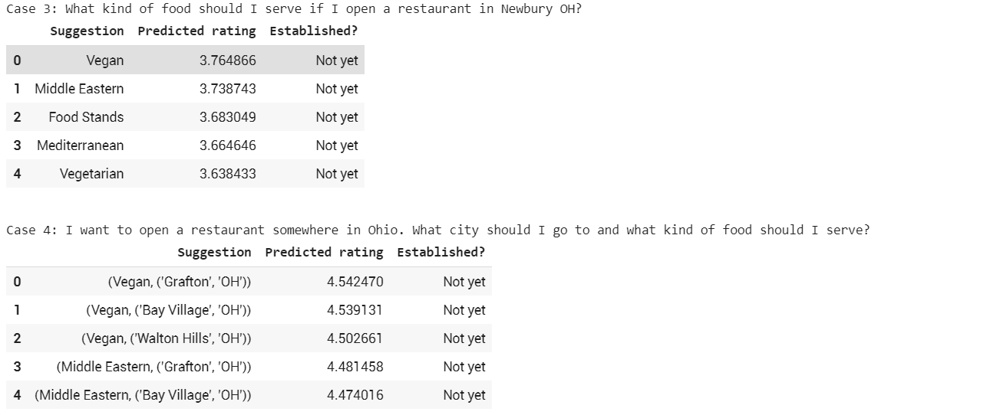

# References

### Data sources

- https://apps.bea.gov/itable/iTable.cfm?ReqID=70&step=1
- https://www.census.gov/2010census/data/apportionment-data-map.html
- https://www.census.gov/data/datasets/2010/demo/popest/modified-race-data-2010.html
- https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/PEJ5QU



### Tutorials
- https://towardsdatascience.com/collaborative-filtering-with-fastai-3dbdd4ef4f00